## Warning: This notebook contains medical images that could be disturbing

In [1]:
import random
from pathlib import Path

import faiss
import numpy as np
import polars as pl
import torch
import torch.nn as nn
import torchvision.models as models
from IPython.display import display, HTML
import matplotlib.pyplot as plt
from PIL import Image
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, Dataset
from torchvision.transforms import Compose, Resize, ToTensor
from tqdm import tqdm

In [2]:
SEED = 492
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

In [3]:
data_path = Path("../../data/ISIC")
image_path = data_path / "ISIC_2024_Training_Input"
ground_truth_path = data_path / "ISIC_2024_Training_GroundTruth.csv"
metadata_path = data_path / "metadata.csv"
model_path = Path("../../models")

In [4]:
device = torch.device("cuda")

In [5]:
ground_truth_df = pl.read_csv(ground_truth_path)
metadata_df = pl.read_csv(metadata_path)

df = ground_truth_df.join(metadata_df, on="isic_id", how="inner").with_columns(
    (pl.lit(str(image_path)) + "/" + pl.col("isic_id").cast(pl.Utf8) + ".jpg").alias("image_path")
)

patient_stats = df.group_by("patient_id").agg(pl.col("malignant").max().alias("has_malignant")).sort("patient_id")

train_p, val_p = train_test_split(
    patient_stats, test_size=0.1, random_state=SEED, stratify=patient_stats["has_malignant"]
)

train_ids = train_p["patient_id"].to_list()
val_ids = val_p["patient_id"].to_list()

train_df = df.filter(pl.col("patient_id").is_in(train_ids))
val_df = df.filter(pl.col("patient_id").is_in(val_ids))

In [6]:
median_age = train_df["age_approx"].median()
mode_sex = train_df["sex"].drop_nulls().mode()[0]

In [7]:
class ImageOnlyEmbedder(nn.Module):
    def __init__(self):
        super().__init__()
        full_model = models.resnet50(weights=models.ResNet50_Weights.DEFAULT)
        full_model.fc = nn.Sequential(nn.Dropout(0.3), nn.Linear(full_model.fc.in_features, 1))
        full_model.load_state_dict(torch.load(model_path / "best_image_model.pt", weights_only=True))
        self.encoder = nn.Sequential(*list(full_model.children())[:-1])

    def forward(self, x):
        feat = self.encoder(x)
        feat = feat.view(feat.size(0), -1)
        return torch.nn.functional.normalize(feat, p=2, dim=1)

In [8]:
embedder = ImageOnlyEmbedder().to(device)
embedder.eval()

ImageOnlyEmbedder(
  (encoder): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, bias=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, bias=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, bias=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, bias=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
      

In [9]:
class ISICImageDataset(Dataset):
    def __init__(self, dataframe: pl.DataFrame, image_transform):
        self.df = dataframe
        self.image_transform = image_transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.row(idx, named=True)
        img = Image.open(row["image_path"]).convert("RGB")
        img = self.image_transform(img)
        return img, row["isic_id"], row["patient_id"], row["malignant"]

In [10]:
val_transform = Compose([Resize((224, 224)), ToTensor()])

train_dataset = ISICImageDataset(train_df, val_transform)
train_loader = DataLoader(train_dataset, batch_size=128, shuffle=False)

In [11]:
all_embeddings = []
all_isic_ids = []
all_patient_ids = []
all_malignant = []

with torch.no_grad():
    for images, isic_ids, patient_ids, malignants in tqdm(train_loader, desc="Extracting Training Embeddings"):
        images = images.to(device)
        embeddings = embedder(images)
        all_embeddings.append(embeddings.cpu())
        all_isic_ids.extend(isic_ids)
        all_patient_ids.extend(patient_ids)
        all_malignant.extend(malignants.tolist())

all_embeddings = torch.cat(all_embeddings, dim=0).numpy()

Extracting Training Embeddings: 100%|██████████| 2759/2759 [14:45<00:00,  3.11it/s]


In [12]:
all_embeddings = all_embeddings.astype("float32")

malignant_mask = np.array(all_malignant) == 1
benign_mask = np.array(all_malignant) == 0

mal_embeddings = all_embeddings[malignant_mask]
ben_embeddings = all_embeddings[benign_mask]

index_mal = faiss.IndexFlatIP(mal_embeddings.shape[1])
index_mal.add(mal_embeddings)

index_ben = faiss.IndexFlatIP(ben_embeddings.shape[1])
index_ben.add(ben_embeddings)

mal_train_df = train_df.filter(pl.col("malignant") == 1)
ben_train_df = train_df.filter(pl.col("malignant") == 0)

print(f"Malignant Index Size: {index_mal.ntotal}")
print(f"Benign Index Size: {index_ben.ntotal}")

Malignant Index Size: 348
Benign Index Size: 352678


In [13]:
val_dataset = ISICImageDataset(val_df, val_transform)
val_loader = DataLoader(val_dataset, batch_size=128, shuffle=False)

val_embeddings = []
val_isic_ids = []
val_patient_ids = []
val_malignant = []

with torch.no_grad():
    for images, isic_ids, patient_ids, malignants in tqdm(val_loader, desc="Extracting Val Embeddings"):
        images = images.to(device)
        embeddings = embedder(images)
        val_embeddings.append(embeddings.cpu())
        val_isic_ids.extend(isic_ids)
        val_patient_ids.extend(patient_ids)
        val_malignant.extend(malignants.tolist())

val_embeddings = torch.cat(val_embeddings, dim=0).numpy().astype("float32")

Extracting Val Embeddings: 100%|██████████| 376/376 [01:41<00:00,  3.70it/s]


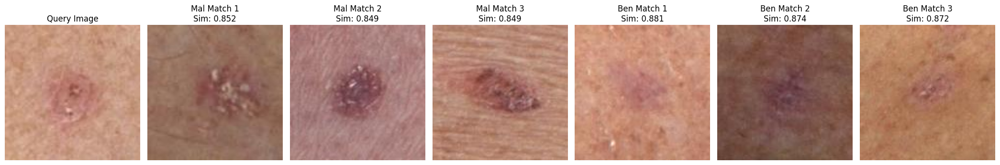

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_0119495""","""IP_6856511""",60.0,"""male""","""upper extremity""",5.27,13.26703,0.7450609,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_2787880""","""IP_1249536""",65.0,"""male""","""lower extremity""",5.89,10.527303,0.520433,0.851855
"""ISIC_6798316""","""IP_9168687""",45.0,"""female""","""lower extremity""",6.98,29.98686,0.5997814,0.849358
"""ISIC_3374114""","""IP_7373371""",60.0,"""female""","""posterior torso""",9.01,30.96266,0.8559193,0.849223


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_6325198""","""IP_0658218""",75.0,"""male""","""lower extremity""",5.5,15.181085,0.668214,0.881284
"""ISIC_8127046""","""IP_9151709""",60.0,"""female""","""lower extremity""",4.77,10.24582,0.7674608,0.874066
"""ISIC_4505549""","""IP_3892916""",60.0,"""male""","""lower extremity""",3.56,5.929818,0.789437,0.87227


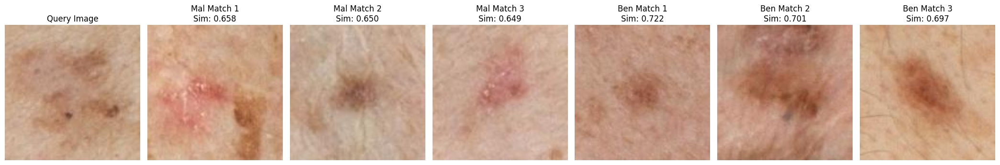

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_1063394""","""IP_9324599""",85.0,"""male""","""upper extremity""",13.29,103.0212,0.6741962,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_5757798""","""IP_1959239""",60.0,"""male""","""anterior torso""",3.25,4.128354,0.834909,0.658277
"""ISIC_1105843""","""IP_3026867""",65.0,"""male""","""upper extremity""",6.3,21.842747,0.703982,0.650335
"""ISIC_0386460""","""IP_7108328""",70.0,"""male""","""anterior torso""",5.34,11.57816,0.8484503,0.648583


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_5383602""","""IP_3927284""",55.0,"""male""","""posterior torso""",4.53,14.299118,0.402459,0.7224
"""ISIC_8455420""","""IP_1117889""",55.0,"""female""","""lower extremity""",8.55,25.258022,0.915326,0.700764
"""ISIC_5513602""","""IP_5543025""",55.0,"""male""","""posterior torso""",9.32,37.94333,0.8284366,0.696801


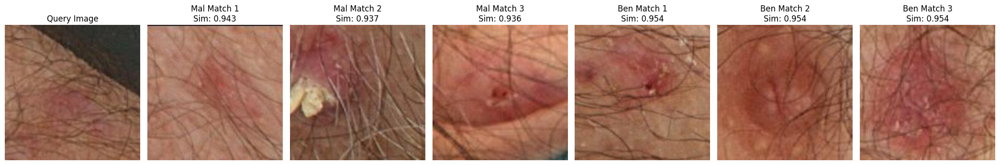

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_1164461""","""IP_3371534""",60.0,"""male""","""upper extremity""",1.13,0.769375,0.772838,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_7314073""","""IP_9496166""",55.0,"""male""","""anterior torso""",5.91,10.24582,0.8978009,0.943243
"""ISIC_9194166""","""IP_7965642""",60.0,"""male""","""anterior torso""",3.42,4.841434,0.8448045,0.937246
"""ISIC_0704481""","""IP_4215006""",60.0,"""female""","""head/neck""",2.57,3.190092,0.842503,0.93571


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_9357694""","""IP_0658218""",75.0,"""male""","""lower extremity""",6.5,16.138112,0.879776,0.954498
"""ISIC_9234892""","""IP_1076642""",60.0,"""male""","""anterior torso""",11.0,77.425408,0.415773,0.953778
"""ISIC_8669329""","""IP_5907007""",75.0,"""male""","""upper extremity""",14.89,74.61062,0.8018673,0.953656


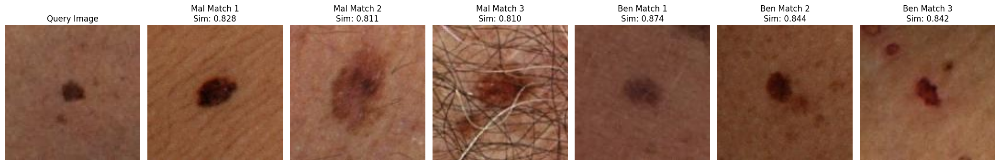

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_1623236""","""IP_0023586""",75.0,"""male""","""lower extremity""",2.74,5.760931,0.430875,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_9266851""","""IP_0152575""",60.0,"""female""","""anterior torso""",5.27,13.679865,0.758764,0.827545
"""ISIC_6166598""","""IP_6774617""",70.0,"""male""","""lower extremity""",9.56,44.62376,0.7591795,0.811375
"""ISIC_0763691""","""IP_8030518""",70.0,"""male""","""anterior torso""",8.3,23.3815,0.8429331,0.809842


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_4120230""","""IP_5284141""",30.0,"""male""","""posterior torso""",4.79,13.6611,0.6929075,0.873561
"""ISIC_4555131""","""IP_2608033""",50.0,"""male""","""posterior torso""",5.8,13.473447,0.855821,0.844068
"""ISIC_0819823""","""IP_2931167""",70.0,"""female""","""unknown""",3.6,7.355977,0.739014,0.842063


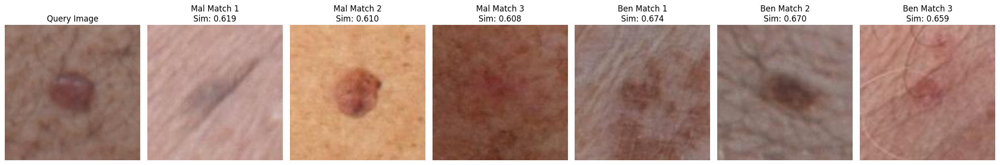

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_1721956""","""IP_3921915""",45.0,"""male""","""posterior torso""",6.39,22.687183,0.605732,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_3832733""","""IP_3056186""",75.0,"""male""","""posterior torso""",9.74,30.249578,0.851311,0.61904
"""ISIC_0527743""","""IP_9211554""",65.0,"""female""","""posterior torso""",5.49,22.31188,0.395987,0.609882
"""ISIC_3894462""","""IP_1664093""",70.0,"""male""","""head/neck""",1.23,0.881967,0.782452,0.607508


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_5435882""","""IP_1621549""",65.0,"""male""","""upper extremity""",5.32,13.173203,0.74104,0.674393
"""ISIC_5066030""","""IP_8590096""",75.0,"""male""","""anterior torso""",11.36,29.76168,0.8790497,0.670164
"""ISIC_3750799""","""IP_9175987""",65.0,"""male""","""anterior torso""",4.32,9.194971,0.7279669,0.65862


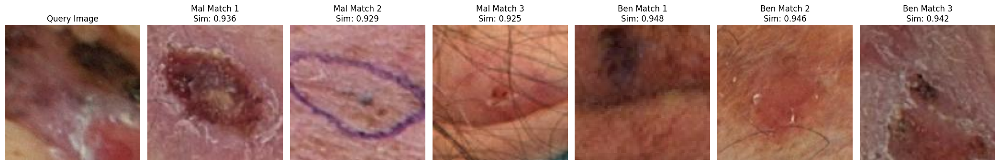

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_2027124""","""IP_6413837""",55.0,"""male""","""posterior torso""",2.4,1.651342,0.9494246,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_7575093""","""IP_5529572""",55.0,"""male""","""lower extremity""",12.96,82.54832,0.7696765,0.935774
"""ISIC_3501835""","""IP_4934005""",60.0,"""male""","""head/neck""",18.94,135.76656,0.870084,0.928701
"""ISIC_0704481""","""IP_4215006""",60.0,"""female""","""head/neck""",2.57,3.190092,0.842503,0.924974


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_1110208""","""IP_0669361""",70.0,"""male""","""head/neck""",1.16,0.900732,0.731274,0.948297
"""ISIC_5190652""","""IP_5961877""",75.0,"""male""","""lower extremity""",9.51,35.01595,0.8240045,0.946347
"""ISIC_1083326""","""IP_4304202""",55.0,"""male""","""lower extremity""",4.51,10.227059,0.714427,0.941634


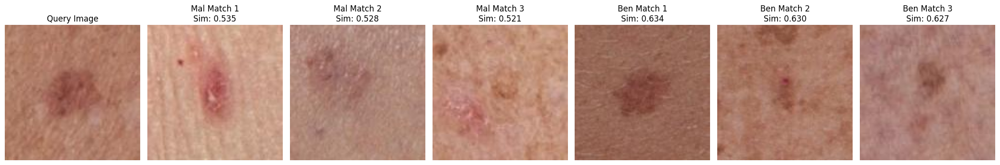

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_2746016""","""IP_8352314""",65.0,"""female""","""lower extremity""",7.01,25.57703,0.7048099,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_5536448""","""IP_7977194""",65.0,"""male""","""anterior torso""",6.38,17.48921,0.8519212,0.535179
"""ISIC_7105211""","""IP_9978624""",55.0,"""female""","""lower extremity""",1.59,1.013323,0.8710382,0.528168
"""ISIC_4954780""","""IP_3619408""",70.0,"""female""","""anterior torso""",1.97,1.595046,0.871481,0.520555


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_2705924""","""IP_5792141""",25.0,"""female""","""posterior torso""",6.58,21.26102,0.6944163,0.634316
"""ISIC_1314362""","""IP_7770500""",55.0,"""male""","""posterior torso""",3.84,6.83055,0.8192825,0.630388
"""ISIC_3234239""","""IP_3026693""",75.0,"""female""","""lower extremity""",9.55,24.863952,0.919484,0.627212


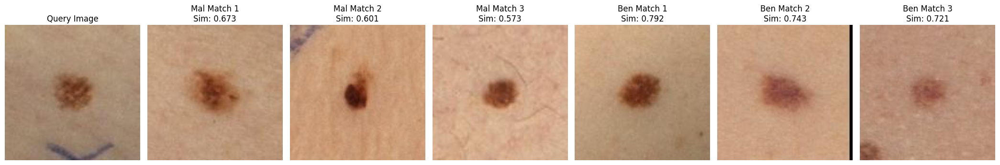

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_3377793""","""IP_2506030""",55.0,"""female""","""lower extremity""",4.8,14.787014,0.55214,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_4114301""","""IP_7240141""",45.0,"""female""","""posterior torso""",5.95,22.93113,0.6235117,0.673487
"""ISIC_2068746""","""IP_1474479""",70.0,"""male""","""upper extremity""",5.3,13.098142,0.785371,0.600525
"""ISIC_3288933""","""IP_5471913""",25.0,"""female""","""lower extremity""",4.38,12.85419,0.5992054,0.573338


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_3495019""","""IP_7293666""",65.0,"""male""","""upper extremity""",5.48,17.69563,0.6129407,0.791848
"""ISIC_0333691""","""IP_2482185""",25.0,"""female""","""posterior torso""",6.01,19.984988,0.73373,0.743496
"""ISIC_9141642""","""IP_0039318""",35.0,"""male""","""posterior torso""",3.84,10.095703,0.557255,0.721231


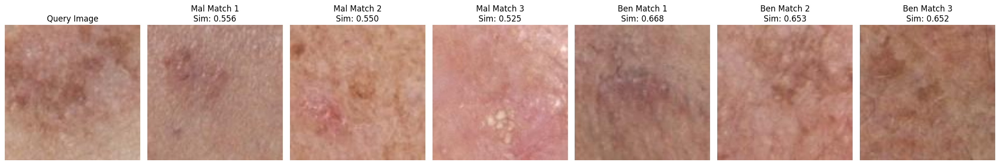

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_3398012""","""IP_9324599""",85.0,"""male""","""anterior torso""",2.33,4.165885,0.4858239,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_7105211""","""IP_9978624""",55.0,"""female""","""lower extremity""",1.59,1.013323,0.8710382,0.556252
"""ISIC_4954780""","""IP_3619408""",70.0,"""female""","""anterior torso""",1.97,1.595046,0.871481,0.549899
"""ISIC_6382027""","""IP_2456971""",60.0,"""male""","""head/neck""",2.79,2.68343,0.886807,0.524543


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_1543311""","""IP_9168687""",45.0,"""female""","""anterior torso""",6.05,15.27491,0.8159921,0.668236
"""ISIC_8080758""","""IP_1045154""",80.0,"""male""","""anterior torso""",2.69,3.0775,0.849887,0.653271
"""ISIC_0227204""","""IP_0431324""",70.0,"""male""","""lower extremity""",2.6,2.889848,0.879741,0.651993


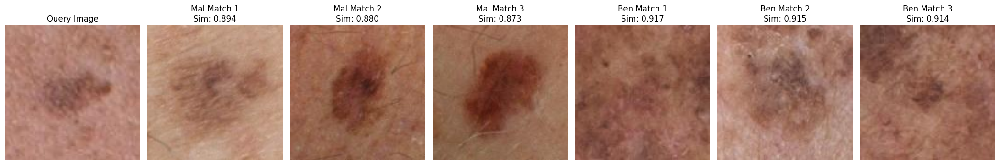

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_3467445""","""IP_8683966""",50.0,"""male""","""head/neck""",7.6,25.08913,0.8007054,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_6068699""","""IP_7746572""",80.0,"""male""","""upper extremity""",11.55,72.84669,0.6095133,0.894183
"""ISIC_6166598""","""IP_6774617""",70.0,"""male""","""lower extremity""",9.56,44.62376,0.7591795,0.879905
"""ISIC_5875571""","""IP_5811816""",85.0,"""male""","""anterior torso""",11.23,60.27397,0.8012677,0.873321


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_4919898""","""IP_7797815""",75.0,"""male""","""anterior torso""",5.32,11.29668,0.7448692,0.916962
"""ISIC_3656866""","""IP_3785831""",70.0,"""male""","""anterior torso""",10.72,62.638394,0.564337,0.914932
"""ISIC_3049600""","""IP_7797815""",75.0,"""male""","""anterior torso""",3.87,10.02064,0.5025271,0.914354


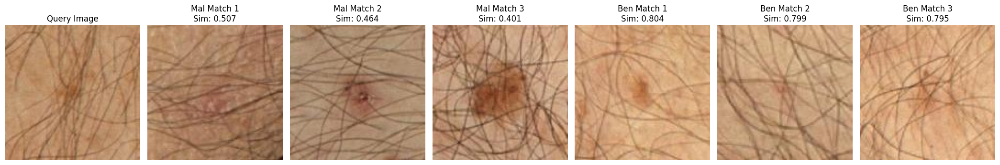

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_0051897""","""IP_5516884""",60.0,"""male""","""upper extremity""",4.6,6.192531,0.9049373,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_3091180""","""IP_0698187""",60.0,"""male""","""upper extremity""",1.53,1.576281,0.674284,0.50676
"""ISIC_8269383""","""IP_7293666""",65.0,"""male""","""lower extremity""",3.74,7.825108,0.6673599,0.464261
"""ISIC_0554252""","""IP_7411721""",45.0,"""male""","""anterior torso""",7.38,32.37005,0.6437153,0.400863


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_8655222""","""IP_0869661""",70.0,"""male""","""anterior torso""",3.4,5.592044,0.76767,0.803923
"""ISIC_1040668""","""IP_7611905""",55.0,"""male""","""lower extremity""",3.1,3.921937,0.8350315,0.798548
"""ISIC_7504729""","""IP_4111386""",65.0,"""male""","""anterior torso""",3.1,4.653781,0.724903,0.795101


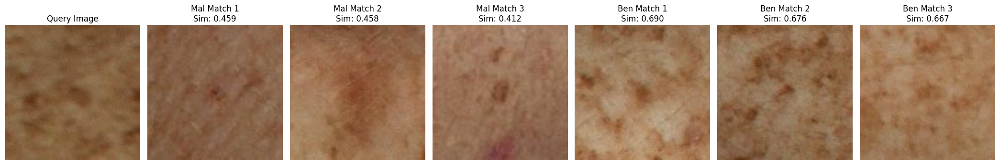

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_0051958""","""IP_9726832""",85.0,"""male""","""posterior torso""",3.56,7.036968,0.7339323,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_2604412""","""IP_6423094""",70.0,"""female""","""posterior torso""",1.3,1.088384,0.7118513,0.459088
"""ISIC_4867539""","""IP_3144881""",60.0,"""female""","""upper extremity""",2.74,3.771815,0.792608,0.457516
"""ISIC_4495429""","""IP_6423094""",70.0,"""female""","""lower extremity""",2.19,4.090824,0.5069475,0.412195


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_1559785""","""IP_5714646""",40.0,"""male""","""upper extremity""",3.36,5.535748,0.7564377,0.689835
"""ISIC_4545590""","""IP_5714646""",40.0,"""male""","""upper extremity""",2.52,2.570839,0.8887027,0.675767
"""ISIC_0538198""","""IP_7411721""",45.0,"""male""","""upper extremity""",2.64,3.509101,0.7967437,0.666683


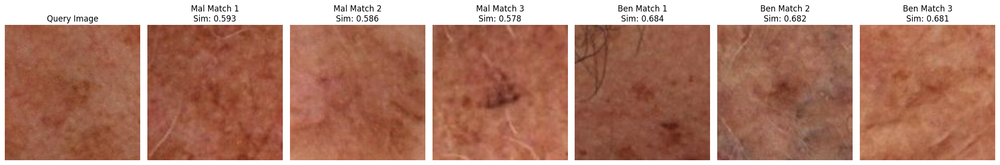

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_0052094""","""IP_9179679""",70.0,"""male""","""head/neck""",3.95,7.918934,0.471671,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_4843324""","""IP_4890448""",60.0,"""male""","""posterior torso""",2.32,2.026647,0.874117,0.592656
"""ISIC_3445540""","""IP_8557750""",80.0,"""female""","""head/neck""",1.1,0.8444361,0.6141035,0.58632
"""ISIC_6776067""","""IP_1907604""",55.0,"""male""","""head/neck""",5.15,12.253706,0.495848,0.577521


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_4369026""","""IP_6611217""",55.0,"""male""","""head/neck""",2.94,3.415275,0.8912855,0.683554
"""ISIC_8817815""","""IP_6598006""",75.0,"""male""","""lower extremity""",2.81,5.892287,0.2935088,0.681977
"""ISIC_3250578""","""IP_5143034""",80.0,"""male""","""posterior torso""",4.73,7.449803,0.89267,0.681094


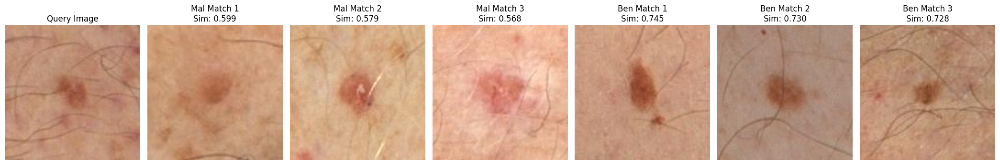

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_0073511""","""IP_3371534""",60.0,"""male""","""lower extremity""",4.17,8.969788,0.762354,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_5347922""","""IP_7848492""",60.0,"""female""","""head/neck""",3.05,5.460687,0.6827152,0.598968
"""ISIC_7583570""","""IP_1959239""",60.0,"""male""","""anterior torso""",5.1,13.867517,0.683192,0.579033
"""ISIC_9615085""","""IP_6391213""",85.0,"""male""","""anterior torso""",5.34,17.62057,0.3745186,0.568044


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_1674463""","""IP_4565930""",55.0,"""female""","""lower extremity""",7.7,17.958341,0.895321,0.745131
"""ISIC_3497695""","""IP_2619972""",50.0,"""male""","""upper extremity""",4.4,13.923813,0.439458,0.730086
"""ISIC_6456382""","""IP_0826114""",55.0,"""male""","""lower extremity""",3.17,6.004879,0.616864,0.728493


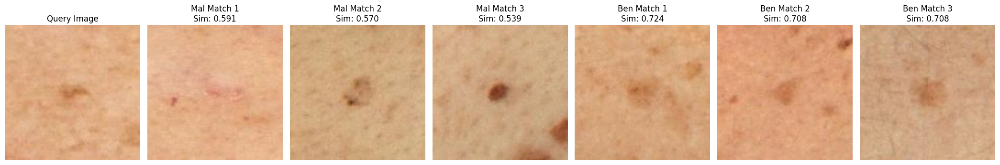

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_0073555""","""IP_3371534""",60.0,"""male""","""posterior torso""",2.76,3.490336,0.839144,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_4907011""","""IP_5709986""",65.0,"""female""","""posterior torso""",1.47,0.8819666,0.9109259,0.590724
"""ISIC_3813551""","""IP_3576950""",40.0,"""female""","""posterior torso""",3.6,5.986114,0.842781,0.570118
"""ISIC_3266736""","""IP_6321403""",60.0,"""male""","""upper extremity""",3.01,5.479452,0.6577945,0.538688


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_8002820""","""IP_9497636""",50.0,"""female""","""posterior torso""",3.42,6.943141,0.562229,0.723743
"""ISIC_7729421""","""IP_7734648""",50.0,"""male""","""upper extremity""",2.6,4.635016,0.4872446,0.708388
"""ISIC_9339408""","""IP_4579352""",60.0,"""male""","""lower extremity""",3.0,5.197973,0.624322,0.708293


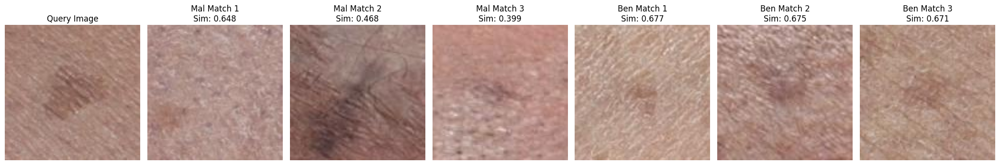

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_0073777""","""IP_4905048""",45.0,"""female""","""lower extremity""",6.34,23.531619,0.475515,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_3964079""","""IP_1039004""",80.0,"""female""","""lower extremity""",1.07,0.731845,0.689718,0.647583
"""ISIC_5204454""","""IP_0277335""",55.0,"""male""","""lower extremity""",1.51,1.444924,0.744162,0.46816
"""ISIC_5985180""","""IP_9801595""",60.0,"""male""","""head/neck""",2.7,4.109589,0.5925312,0.399483


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_5518109""","""IP_8977835""",80.0,"""male""","""lower extremity""",3.17,4.128354,0.8529223,0.6765
"""ISIC_0545842""","""IP_5294508""",55.0,"""male""","""lower extremity""",3.12,4.841434,0.7304513,0.674845
"""ISIC_0186923""","""IP_3154471""",70.0,"""male""","""lower extremity""",4.52,9.044849,0.654949,0.671464


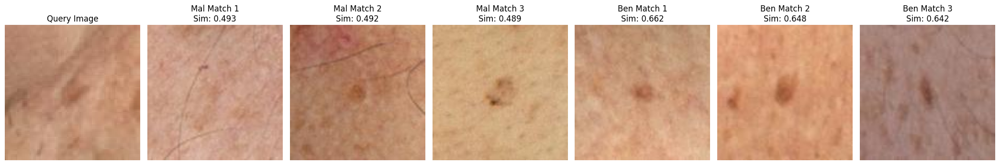

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_0073877""","""IP_3921915""",50.0,"""male""","""upper extremity""",4.11,4.710077,0.938472,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_2581432""","""IP_9181133""",60.0,"""male""","""anterior torso""",1.53,1.651342,0.6556506,0.493113
"""ISIC_6249729""","""IP_0973797""",65.0,"""male""","""anterior torso""",1.74,2.25183,0.401645,0.492077
"""ISIC_3813551""","""IP_3576950""",40.0,"""female""","""posterior torso""",3.6,5.986114,0.842781,0.489322


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_4298153""","""IP_8892837""",60.0,"""female""","""lower extremity""",2.6,4.034528,0.7087353,0.662074
"""ISIC_5218078""","""IP_9724369""",55.0,"""male""","""posterior torso""",2.52,4.747607,0.5338232,0.648044
"""ISIC_8969010""","""IP_1438784""",50.0,"""male""","""posterior torso""",2.62,3.602927,0.786382,0.641716


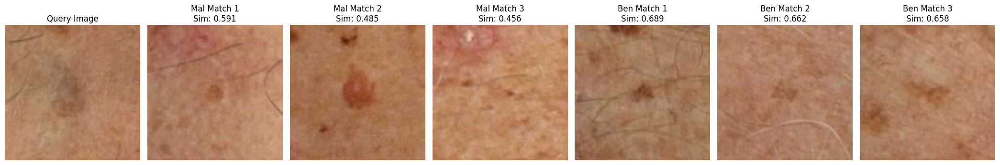

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_0073944""","""IP_6863831""",60.0,"""male""","""lower extremity""",4.84,8.275474,0.8786305,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_6249729""","""IP_0973797""",65.0,"""male""","""anterior torso""",1.74,2.25183,0.401645,0.591296
"""ISIC_5328578""","""IP_4414342""",40.0,"""female""","""posterior torso""",4.18,11.109026,0.563889,0.484602
"""ISIC_4700100""","""IP_3844290""",55.0,"""male""","""posterior torso""",3.31,3.621693,0.906205,0.456315


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_4200992""","""IP_1127121""",65.0,"""male""","""unknown""",2.84,4.597485,0.774809,0.689111
"""ISIC_2643091""","""IP_8666903""",70.0,"""male""","""anterior torso""",2.63,3.377744,0.8549438,0.662402
"""ISIC_6392990""","""IP_6598006""",75.0,"""male""","""anterior torso""",5.08,8.33177,0.9129042,0.658331


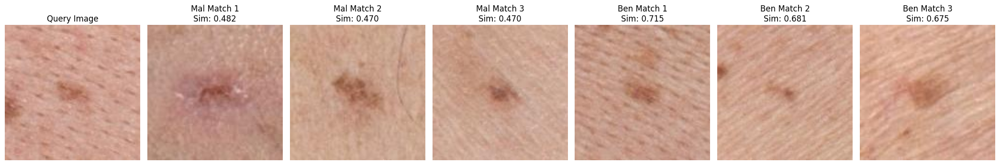

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_0074460""","""IP_7152379""",55.0,"""male""","""posterior torso""",3.83,6.323888,0.8581613,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_8404669""","""IP_3154471""",70.0,"""male""","""head/neck""",5.48,14.392944,0.780451,0.481888
"""ISIC_9521124""","""IP_6032376""",75.0,"""male""","""upper extremity""",5.14,11.59692,0.8686641,0.470105
"""ISIC_6095295""","""IP_0325406""",55.0,"""female""","""upper extremity""",3.45,7.768812,0.616804,0.469666


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_0129253""","""IP_2189124""",40.0,"""male""","""posterior torso""",3.56,6.098705,0.828309,0.714735
"""ISIC_9729265""","""IP_5989034""",45.0,"""male""","""posterior torso""",3.03,2.6459,0.9301606,0.680899
"""ISIC_0158367""","""IP_8689079""",65.0,"""female""","""posterior torso""",4.65,10.65866,0.761636,0.674691


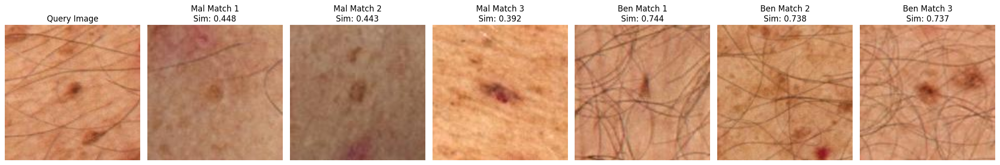

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_0074664""","""IP_9179679""",70.0,"""male""","""posterior torso""",3.01,4.034528,0.8523205,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_6249729""","""IP_0973797""",65.0,"""male""","""anterior torso""",1.74,2.25183,0.401645,0.448189
"""ISIC_4495429""","""IP_6423094""",70.0,"""female""","""lower extremity""",2.19,4.090824,0.5069475,0.443448
"""ISIC_3581982""","""IP_5585622""",45.0,"""male""","""posterior torso""",5.41,10.47101,0.8984978,0.392242


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_3368014""","""IP_7331742""",65.0,"""male""","""posterior torso""",3.33,5.911053,0.7420228,0.744226
"""ISIC_7297984""","""IP_0658218""",75.0,"""male""","""posterior torso""",5.04,9.87052,0.801066,0.737851
"""ISIC_6425745""","""IP_9588095""",45.0,"""male""","""posterior torso""",2.81,5.460687,0.5046044,0.737495


In [14]:
full_model = models.resnet50(weights=models.ResNet50_Weights.DEFAULT)
full_model.fc = nn.Sequential(nn.Dropout(0.3), nn.Linear(full_model.fc.in_features, 1))
full_model.load_state_dict(torch.load(model_path / "best_image_model.pt", weights_only=True))
full_model = full_model.to(device)
full_model.eval()

val_mal_indices = [i for i, m in enumerate(val_malignant) if m == 1][:10]
val_ben_indices = [i for i, m in enumerate(val_malignant) if m == 0][:10]
query_indices = val_mal_indices + val_ben_indices

display_cols = [
    "isic_id", "patient_id", "age_approx", "sex", "anatom_site_general",
    "clin_size_long_diam_mm", "tbp_lv_areaMM2", "tbp_lv_eccentricity"
]


def get_ordered_raw_table(isic_ids, sims):
    ordered_df = pl.DataFrame({"isic_id": isic_ids, "similarity": sims})
    raw_features = df.select(display_cols)
    result = ordered_df.join(raw_features, on="isic_id", how="left", maintain_order="left")

    result = result.with_columns(
        pl.col("age_approx").fill_null(median_age),
        pl.col("sex").fill_null(mode_sex),
        pl.col("anatom_site_general").fill_null("unknown")
    )

    cols = [c for c in result.columns if c != "similarity"] + ["similarity"]
    return result.select(cols)


for q_idx in query_indices:
    query_emb = val_embeddings[q_idx].reshape(1, -1)

    D_mal, I_mal = index_mal.search(query_emb, 3)
    D_ben, I_ben = index_ben.search(query_emb, 3)

    q_row = val_df.row(q_idx, named=True)
    gt_class = "Malignant" if q_row["malignant"] == 1 else "Benign"

    img = Image.open(q_row['image_path']).convert("RGB")
    img_tensor = val_transform(img).unsqueeze(0).to(device)

    with torch.no_grad():
        logit = full_model(img_tensor)
        prob = torch.sigmoid(logit).item()

    display(HTML(f"<h3>Query: {q_row['isic_id']} | Ground Truth: {gt_class} | Predicted Probability: {prob:.4f}</h3>"))

    fig, axes = plt.subplots(1, 7, figsize=(21, 4))

    axes[0].imshow(img)
    axes[0].set_title("Query Image")
    axes[0].axis('off')

    for i in range(3):
        m_row = mal_train_df.row(I_mal[0][i], named=True)
        axes[i + 1].imshow(Image.open(m_row['image_path']))
        axes[i + 1].set_title(f"Mal Match {i + 1}\nSim: {D_mal[0][i]:.3f}")
        axes[i + 1].axis('off')

    for i in range(3):
        b_row = ben_train_df.row(I_ben[0][i], named=True)
        axes[i + 4].imshow(Image.open(b_row['image_path']))
        axes[i + 4].set_title(f"Ben Match {i + 1}\nSim: {D_ben[0][i]:.3f}")
        axes[i + 4].axis('off')

    plt.tight_layout()
    plt.show()

    q_table = get_ordered_raw_table([q_row['isic_id']], [1.0])
    display(HTML("<b>Query Tabular Data:</b>"))
    display(q_table)

    mal_ids = I_mal[0].tolist()
    mal_sims = D_mal[0].tolist()
    mal_isic_ids = mal_train_df.gather(mal_ids)["isic_id"].to_list()
    mal_table = get_ordered_raw_table(mal_isic_ids, mal_sims)
    display(HTML("<b>Top 3 Malignant Matches:</b>"))
    display(mal_table)

    ben_ids = I_ben[0].tolist()
    ben_sims = D_ben[0].tolist()
    ben_isic_ids = ben_train_df.gather(ben_ids)["isic_id"].to_list()
    ben_table = get_ordered_raw_table(ben_isic_ids, ben_sims)
    display(HTML("<b>Top 3 Benign Matches:</b>"))
    display(ben_table)

    display(HTML("<hr>"))